In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [5]:
dfg = pd.read_csv('Data.csv')
dfe = dfg[dfg['genre'] != 'Indie']
df = dfg[dfg['genre'] == 'Indie']

In [3]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore_zscore_zscore,energy_zscore_zscore_zscore,instrumentalness_zscore_zscore_zscore,liveness_zscore_zscore_zscore,loudness_zscore_zscore_zscore,speechiness_zscore_zscore_zscore,tempo_zscore_zscore_zscore,valence_zscore_zscore_zscore,lognorm_duration_zscore_zscore_zscore,Count_zscore_zscore_zscore
count,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,...,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000,9543.000000
mean,148404.261134,54.701561,0.331214,0.566821,224150.373991,0.581002,0.085317,0.168919,-7.915142,0.066724,...,-0.113691,0.029238,-0.218621,-0.242280,0.285024,-0.277691,0.070787,-0.055449,-0.017290,-0.300559
std,8700.141965,7.355754,0.321618,0.140346,53238.329300,0.217834,0.209438,0.126682,3.277045,0.070631,...,0.434644,0.812073,0.685388,0.625486,0.529647,0.365506,0.927013,0.852381,0.587731,0.321363
min,141602.000000,0.000000,0.000001,0.061700,35433.000000,0.005540,0.000000,0.021100,-29.729000,0.022600,...,-1.654403,-2.116050,-0.497823,-0.972133,-3.240608,-0.506025,-2.563691,-1.597712,-4.595473,-0.599141
25%,143987.500000,49.000000,0.034100,0.474000,192198.000000,0.421000,0.000000,0.097400,-9.619500,0.032700,...,-0.374555,-0.567240,-0.497823,-0.595404,0.009560,-0.453759,-0.651296,-0.734970,-0.336875,-0.529856
50%,146373.000000,54.000000,0.217000,0.572000,217557.000000,0.592000,0.000174,0.118000,-7.303000,0.040800,...,-0.167521,0.070238,-0.497254,-0.493692,0.383960,-0.411843,0.027876,-0.142628,-0.024737,-0.401946
75%,148758.500000,59.000000,0.614000,0.669000,248410.000000,0.756000,0.018750,0.193000,-5.555500,0.064300,...,0.084367,0.681620,-0.436463,-0.123382,0.666397,-0.290234,0.675103,0.555488,0.309275,-0.188763
max,177881.000000,97.000000,0.995000,0.953000,798693.000000,0.998000,0.976000,0.962000,-0.198000,0.869000,...,4.576946,1.583781,2.696148,3.673529,1.532295,3.873977,3.313574,2.069037,3.250698,1.031711


In [4]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']
print(df.corr())
print(pop.corr())
print(nonpop.corr())

                                       Unnamed: 0  popularity  acousticness  \
Unnamed: 0                               1.000000   -0.436521     -0.026026   
popularity                              -0.436521    1.000000      0.057699   
acousticness                            -0.026026    0.057699      1.000000   
danceability                            -0.049587    0.097425     -0.089351   
duration_ms                              0.025900   -0.024698      0.003190   
energy                                   0.025234   -0.072737     -0.743078   
instrumentalness                         0.032911   -0.076112      0.070694   
liveness                                 0.017073   -0.039362     -0.128993   
loudness                                -0.003926   -0.005017     -0.636469   
speechiness                             -0.007067    0.035509     -0.068997   
tempo                                    0.030186   -0.053499     -0.109804   
valence                                 -0.007923   

AxesSubplot(0.125,0.125;0.62x0.755)


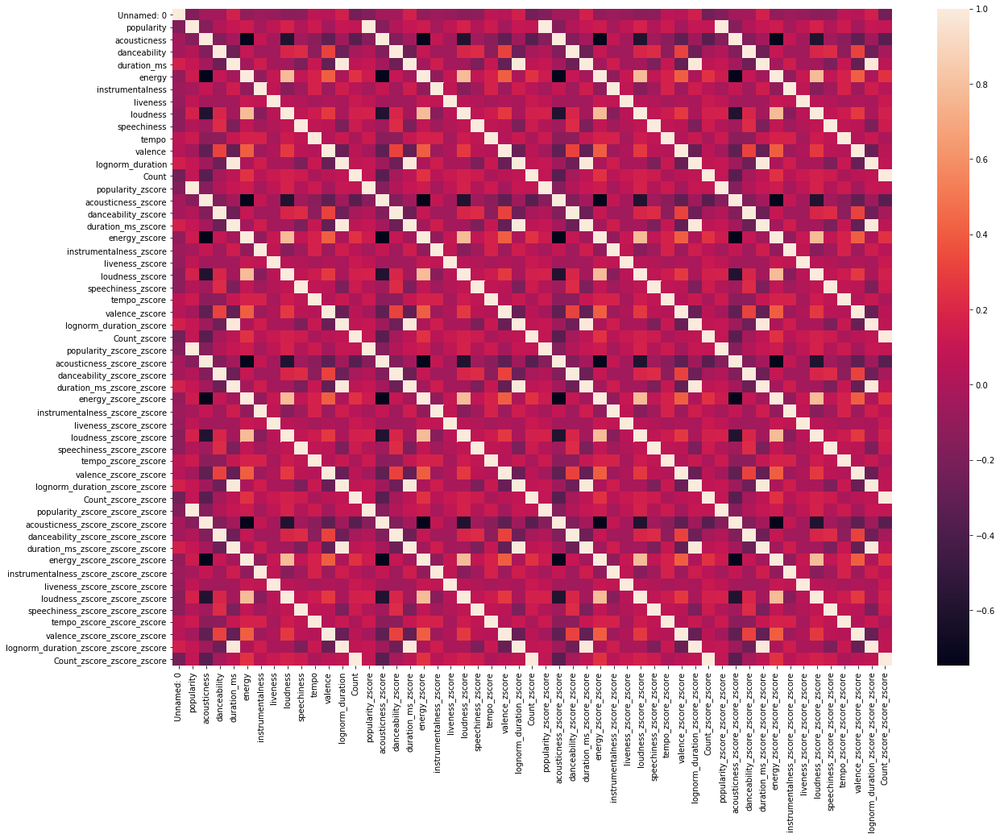

In [6]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(pop.corr())
print(m)
n = sns.pairplot(data=pop)
print(n)

In [20]:
#plt.subplots(figsize=(20,15))

#m = sns.heatmap(nonpop.corr())
#print(m)
#p = sns.pairplot(data=nonpop)
#print(p)

<ErrorbarContainer object of 3 artists>

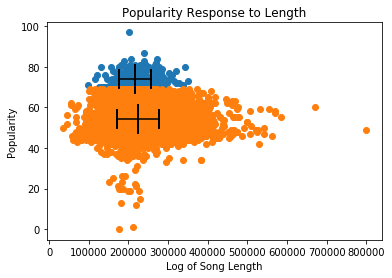

In [8]:
plt.scatter(pop.duration_ms, pop.popularity)
plt.scatter(nonpop.duration_ms, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Length")

plt.errorbar(np.mean(pop.duration_ms),np.mean(pop.popularity),xerr=np.std(pop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.duration_ms),np.mean(nonpop.popularity),xerr=np.std(nonpop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

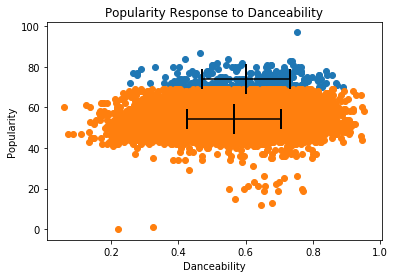

In [9]:
plt.scatter(pop.danceability, pop.popularity)
plt.scatter(nonpop.danceability, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Danceability")

plt.errorbar(np.mean(pop.danceability),np.mean(pop.popularity),xerr=np.std(pop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.danceability),np.mean(nonpop.popularity),xerr=np.std(nonpop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

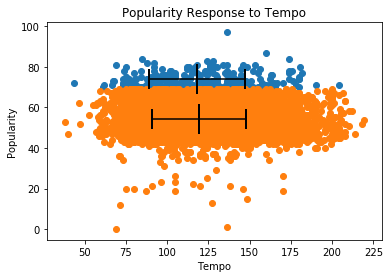

In [12]:
plt.scatter(pop.tempo, pop.popularity)
plt.scatter(nonpop.tempo, nonpop.popularity)
plt.xlabel("Tempo")
plt.ylabel("Popularity")
plt.title("Popularity Response to Tempo")

plt.errorbar(np.mean(pop.tempo),np.mean(pop.popularity),xerr=np.std(pop.tempo),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.tempo),np.mean(nonpop.popularity),xerr=np.std(nonpop.tempo),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

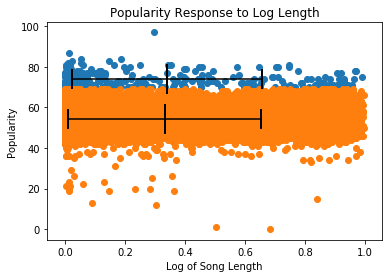

In [14]:
plt.scatter(pop.acousticness, pop.popularity)
plt.scatter(nonpop.acousticness, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Log Length")

plt.errorbar(np.mean(pop.acousticness),np.mean(pop.popularity),xerr=np.std(pop.acousticness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.acousticness),np.mean(nonpop.popularity),xerr=np.std(nonpop.acousticness),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

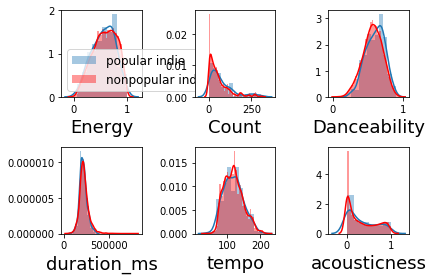

In [15]:

plt.subplot(231)
sns.distplot(pop.energy, label='popular indie')
sns.distplot(nonpop.energy, color='r', label='nonpopular indie')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(nonpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(nonpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(nonpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.tempo)
sns.distplot(nonpop.tempo, color='r')
plt.xlabel('tempo', fontsize=18)

plt.subplot(236)
sns.distplot(pop.acousticness)
sns.distplot(nonpop.acousticness, color='r')
plt.xlabel('acousticness', fontsize=18)

plt.tight_layout()
plt.show()


/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


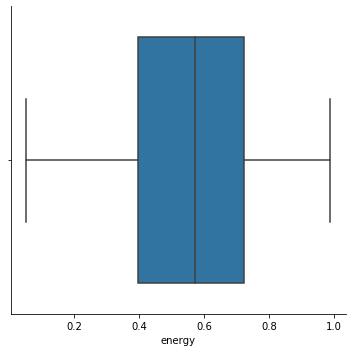

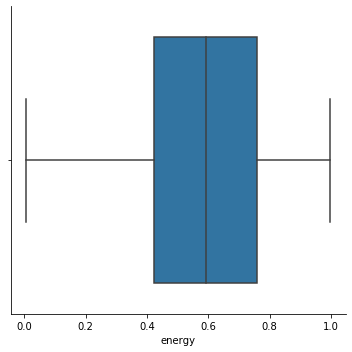

In [16]:
sns.factorplot(x='energy', data=pop, kind='box')


sns.factorplot(x='energy', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


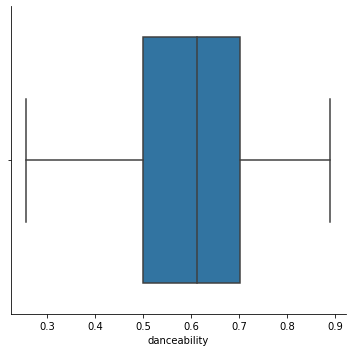

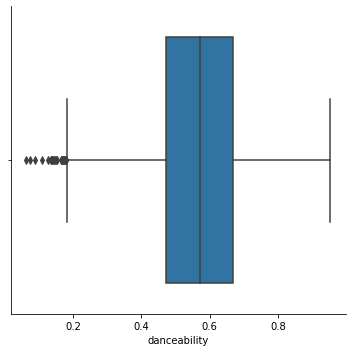

In [17]:
sns.factorplot(x='danceability', data=pop, kind='box')
sns.factorplot(x='danceability', data=nonpop, kind='box')
plt.show()

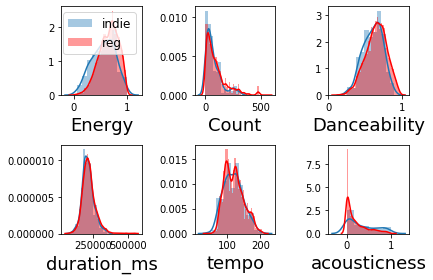

In [19]:


plt.subplot(231)
sns.distplot(pop.energy, label='indie')
sns.distplot(allpop.energy, color='r', label='reg')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.Count)
sns.distplot(allpop.Count, color='r')
plt.xlabel('Count', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(allpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(allpop.duration_ms, color='r')
plt.xlabel('duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.tempo)
sns.distplot(allpop.tempo, color='r')
plt.xlabel('tempo', fontsize=18)

plt.subplot(236)
sns.distplot(pop.acousticness)
sns.distplot(allpop.acousticness, color='r')
plt.xlabel('acousticness', fontsize=18)



plt.tight_layout()
plt.show()
